In [1]:
import numpy as np
from io import StringIO
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import pandas_datareader
import datetime
import pandas_datareader.data as web
from scipy.stats import norm
import yfinance as yf
import cufflinks as cf
cf.go_offline()

In [2]:
dfticker = pd.read_csv("//Users//sjacob//stocks//NEWSTOCK.csv", index_col = False)
tickers = []
length = len(dfticker)
for i in range(0,length):
    tickers.append(dfticker['Ticker'][i]+".NS")

In [3]:
data = pd.DataFrame()

data = yf.download(tickers,period="4y")
     
data = data['Adj Close']
        
data.to_csv("//Users//sjacob//stocks//QGRJUNE2023.csv")
data.dropna()

[*********************100%***********************]  47 of 47 completed


,ABB.NS,ACE.NS,BAJAJ-AUTO.NS,BEL.NS,BLS.NS,CAPLIPOINT.NS,CDSL.NS,CMSINFO.NS,DENORA.NS,DRCSYSTEMS.NS,...,SIRCA.NS,SKFINDIA.NS,SMLT.NS,SUNTV.NS,TIDEWATER.NS,TRITURBINE.NS,VINATIORGA.NS,VINYLINDIA.NS,VOLTAMP.NS,WENDT.NS
Date,,,,,,,,,,,,,,,,,,,,,
2022-03-29,2022.799438,213.409897,3343.248291,67.571846,58.515167,681.757080,1416.401001,258.258911,408.892090,38.049999,...,226.271820,3405.587402,97.012436,453.503174,1031.822021,197.338882,2021.943726,252.906769,1947.237183,4842.941895
2022-03-30,2067.148682,222.331039,3329.654541,67.913940,58.664440,682.054016,1416.449829,266.467773,410.089172,38.049999,...,224.212982,3444.606201,93.395851,464.341614,1036.542358,196.491928,1959.459595,252.418732,1965.814209,4948.895508
2022-03-31,2141.014404,239.724792,3310.532227,68.679581,58.552486,671.216736,1443.360107,260.470917,399.265839,38.049999,...,230.612701,3491.329590,91.538681,465.720154,1018.577637,201.424149,1940.286987,256.176727,1931.715332,4961.986816
2022-04-01,2097.706787,234.890427,3389.285400,70.080528,61.475758,704.371765,1459.106567,266.418610,419.116913,38.049999,...,240.485107,3494.441406,98.087639,473.848999,1056.890015,203.118057,1964.426392,262.179718,1940.042969,5025.920898
2022-04-04,2113.829102,228.859940,3410.808838,71.497787,64.050728,768.554077,1474.414307,267.794922,440.065277,39.650002,...,244.503540,3545.412354,106.835861,473.611267,1092.635864,202.918762,1966.065674,272.965546,1943.196655,5041.168945
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-04,4824.750000,899.799988,6922.149902,186.899994,337.899994,1406.849976,1885.050049,379.399994,1557.650024,44.650002,...,412.549988,4539.299805,271.750000,729.750000,1386.250000,421.399994,1740.449951,455.600006,6671.450195,14225.049805
2024-01-05,4832.350098,911.400024,6978.500000,185.949997,336.250000,1399.750000,1888.650024,378.850006,1575.650024,44.349998,...,427.799988,4589.700195,277.149994,721.299988,1395.800049,412.850006,1740.750000,457.850006,6580.700195,14286.950195
2024-01-08,4752.950195,907.049988,6983.850098,183.600006,350.649994,1389.599976,1873.800049,379.100006,1601.400024,46.549999,...,419.549988,4624.549805,280.700012,719.900024,1373.800049,407.399994,1727.199951,467.700012,6539.049805,14441.450195


In [4]:
returns = np.log(data / data.shift(1))
vols = returns.std() * 252 ** 0.5 *100
vols

ABB.NS            32.302753
ACE.NS            51.709838
BAJAJ-AUTO.NS     27.843336
BEL.NS            38.353697
BLS.NS            58.388180
CAPLIPOINT.NS     46.446814
CDSL.NS           38.134323
CMSINFO.NS        32.496075
DENORA.NS         58.733577
DRCSYSTEMS.NS    148.965634
ENGINERSIN.NS     37.473293
FOSECOIND.NS      39.107667
GANDHITUBE.NS     43.856412
GLAXO.NS          25.889860
GMBREW.NS         41.349166
GMDCLTD.NS        54.708009
GOLDIAM.NS        51.911347
HERCULES.NS       50.758420
INDOBORAX.NS      46.424029
INDRAMEDCO.NS     44.796361
INGERRAND.NS      35.165563
ITC.NS            27.466679
KSB.NS            38.183379
KSCL.NS           36.272737
LAXMIMACH.NS      35.919042
LINCOLN.NS        42.139082
MAZDA.NS          46.184082
NAM-INDIA.NS      38.300616
NESCO.NS          34.656540
OFSS.NS           29.780900
PANAMAPET.NS      53.139580
PIIND.NS          33.828482
RITES.NS          35.438778
RPGLIFE.NS        46.016927
SHANTIGEAR.NS     49.469414
SHARDACROP.NS     47

In [5]:
annual_returns = returns.mean() * 252 * 100
annual_returns

ABB.NS           33.082978
ACE.NS           61.456505
BAJAJ-AUTO.NS    25.355873
BEL.NS           46.735130
BLS.NS           76.971427
CAPLIPOINT.NS    41.222892
CDSL.NS          50.601223
CMSINFO.NS       23.009081
DENORA.NS        49.195272
DRCSYSTEMS.NS   -35.937721
ENGINERSIN.NS    21.138271
FOSECOIND.NS     25.956542
GANDHITUBE.NS    28.934883
GLAXO.NS         10.083537
GMBREW.NS        14.639590
GMDCLTD.NS       53.520912
GOLDIAM.NS       47.323176
HERCULES.NS      35.828532
INDOBORAX.NS     21.370226
INDRAMEDCO.NS    36.137870
INGERRAND.NS     41.068348
ITC.NS           21.209706
KSB.NS           41.979088
KSCL.NS           8.494276
LAXMIMACH.NS     36.260271
LINCOLN.NS       29.638050
MAZDA.NS         30.679686
NAM-INDIA.NS     12.866272
NESCO.NS          6.873967
OFSS.NS          16.538306
PANAMAPET.NS     42.025969
PIIND.NS         22.675756
RITES.NS         18.926562
RPGLIFE.NS       40.759811
SHANTIGEAR.NS    45.346285
SHARDACROP.NS    15.730396
SHREDIGCEM.NS    38.446980
S

In [6]:
import numpy as np
import pandas as pd
from scipy.stats import norm
import pandas_datareader.data as web
import datetime
import math

class ValueAtRiskMonteCarlo:
    
    def __init__(self, S, mu, sigma, c, n, iterations):
        self.S = S
        self.mu = mu
        self.sigma = sigma
        self.c = c
        self.n = n
        self.iterations = iterations 

    def simulation(self):
        stock_data = np.zeros([self.iterations, 1])	
        rand = np.random.normal(0, 1, [1, self.iterations])

        #equation for the S(t) stock price
        stock_price = self.S*np.exp(self.n*(self.mu - 0.5*self.sigma**2)+self.sigma*np.sqrt(self.n)*rand)
        #we have to sort the stock prices to determine the percentile
        stock_price = np.sort(stock_price)

        #it depends on the confidence level: 95% -> 5 and 99% -> 1
        percentile = np.percentile(stock_price,(1-self.c)*100)

        return self.S-percentile

In [7]:

df = pd.DataFrame(columns = ['Ticker', 'Cov_mar','Market_var','Beta','Volatility%','Return%','CV','Sharp Ratio','CAGR','MAXDD%','Value at Risk']) 
data = pd.DataFrame()
data['^BSESN'] = yf.download('^BSESN',period="3y").Close

for t in tickers:
    try:
        data[t] = yf.download(t,period="3y").Close 
    except:
        continue
    sec_returns = np.log( data / data.shift(1) )
    cov = sec_returns.cov()*252
    cov_with_market = cov[t][0]
 
      
    dr = data[t].pct_change()
    dcum = (1 + dr).cumprod()
    n = len(data)/252
    CAGR = ((dcum[-1])**(1/n) - 1)*100
      
 
    
    droll = dcum.cummax()
    ddw = droll - dcum
    ddmax = ddw/droll
    max_dd = (ddmax.max())*100
   
 

    market_var = sec_returns['^BSESN'].var() * 252

    returns = np.log(data[t] / data[t].shift(1))
    MSFT_beta = cov_with_market / market_var
    MSFT_er = returns.mean()*252
    Sharp = (MSFT_er - 0.05) / (sec_returns[t].std() * 252 ** 0.5)
   

    #returns = np.log(data[t] / data[t].shift(1))
    vols = returns.std() * 252 ** 0.5 *100
    annual_returns = returns.mean() * 252 * 100
    CV = (vols/annual_returns)*100
    S = 100000    #this is the investment (stocks or whatever)
    c=0.95   #condifence level: this time it is 99%
    n = 730   #1 day 
    iterations = 100000 #number of paths in the Monte-Carlo simulation
    mu = np.mean(returns)
    sigma = np.mean(returns.std())

    model = ValueAtRiskMonteCarlo(S,mu,sigma,c,n,iterations)
    val = model.simulation()
    df.loc[len(df.index)] = [t,cov_with_market,market_var,MSFT_beta,vols,annual_returns,CV,Sharp,CAGR,max_dd,val] 
    
    
  

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [10]:
df1 = df[(df['CAGR']>10 ) & (df['Return%']>10)]
df2 = df1.sort_values(by='Return%', ascending=False)
df2

,Ticker,Cov_mar,Market_var,Beta,Volatility%,Return%,CV,Sharp Ratio,CAGR,MAXDD%,Value at Risk
13,BLS.NS,0.022786,0.021845,1.043108,51.327260,85.574569,59.979572,1.569820,135.041249,38.641955,-92215.433664
14,GMDCLTD.NS,0.023630,0.021845,1.081753,57.487155,70.799247,81.197409,1.144590,102.797350,42.975015,3536.950673
19,ACE.NS,0.023697,0.021845,1.084808,46.723038,63.372146,73.728036,1.249323,88.299997,36.268873,-24042.669683
42,DENORA.NS,0.012762,0.021845,0.584235,59.435015,60.849110,97.676062,0.939667,83.614805,35.664564,33568.006399
17,KSB.NS,0.010256,0.021845,0.469505,34.767848,57.716176,60.239348,1.516234,77.767462,29.013796,-69531.208847
22,VOLTAMP.NS,0.015086,0.021845,0.690609,42.040980,56.315102,74.653119,1.220597,75.486342,31.442913,-22483.179439
25,SHANTIGEAR.NS,0.016909,0.021845,0.774071,45.453673,52.059847,87.310425,1.035336,68.185257,28.747176,6007.276225
21,INGERRAND.NS,0.012651,0.021845,0.579124,37.742239,49.016838,76.998519,1.166249,63.151150,24.483418,-17426.774641
2,BEL.NS,0.018603,0.021845,0.851625,31.397501,48.353309,64.933510,1.380789,62.073630,22.007849,-46152.778518
15,TRITURBINE.NS,0.018330,0.021845,0.839127,46.210651,47.861279,96.551224,0.927519,61.279209,31.684732,18984.370508


In [11]:
df2.to_csv("//Users//sjacob//stocks//NEWSTOCKJAN24.csv")

In [12]:
pf_data = pd.DataFrame()
for t in df1["Ticker"]:
    pf_data[t] =  yf.download(t,period="3y").Close 

log_returns = np.log(pf_data / pf_data.shift(1))
num_assets = len(df1["Ticker"])
num_assets
weights = np.random.random(num_assets)
weights /= np.sum(weights)
np.sum(weights * log_returns.mean()) * 252
np.dot(weights.T, np.dot(log_returns.cov() * 252, weights))
np.sqrt(np.dot(weights.T,np.dot(log_returns.cov() * 252, weights)))
pfolio_returns = []
pfolio_volatilities = []
wts = []
for x in range (1000):
    weights = np.random.random(num_assets)
    weights /= np.sum(weights)
    pfolio_returns.append(np.sum(weights * log_returns.mean()) * 252)
    pfolio_volatilities.append(np.sqrt(np.dot(weights.T,np.dot(log_returns.cov() * 252, weights))))
    wts.append(weights)
pfolio_returns = np.array(pfolio_returns)
pfolio_volatilities = np.array(pfolio_volatilities)
wts= np.array(wts)
pfolio_returns, pfolio_volatilities
portfolios = pd.DataFrame({'Return': pfolio_returns, 'Volatility': pfolio_volatilities})
#portfolios.plot(x='Volatility', y='Return', kind='scatter', figsize=(10, 6));
#plt.xlabel('Expected Volatility')
#plt.ylabel('Expected Return')


portfolios.iplot(kind="scatter",
              x="Volatility", y='Return',
              mode='markers',
              xTitle="Volatility", yTitle="Return",
              title="========Volatility-------Return=========================",theme="solar")

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [13]:
import numpy as np
import pandas as pd
from scipy.stats import norm
import pandas_datareader.data as web
import datetime
import math

class ValueAtRiskMonteCarlo:
    
    def __init__(self, S, mu, sigma, c, n, iterations):
        self.S = S
        self.mu = mu
        self.sigma = sigma
        self.c = c
        self.n = n
        self.iterations = iterations 

    def simulation(self):
        stock_data = np.zeros([self.iterations, 1])	
        rand = np.random.normal(0, 1, [1, self.iterations])

        #equation for the S(t) stock price
        stock_price = self.S*np.exp(self.n*(self.mu - 0.5*self.sigma**2)+self.sigma*np.sqrt(self.n)*rand)
        #we have to sort the stock prices to determine the percentile
        stock_price = np.sort(stock_price)

        #it depends on the confidence level: 95% -> 5 and 99% -> 1
        percentile = np.percentile(stock_price,(1-self.c)*100)

        return self.S-percentile

if __name__ == "__main__":
    S = 100000    #this is the investment (stocks or whatever)
    c=0.95   #condifence level: this time it is 99%
    n = 730   #1 day 
    iterations = 100000 #number of paths in the Monte-Carlo simulation

    #historical data to approximate mean and standard deviation
    d = {}

    #download stock related data from Yahoo Finance
    for t in df1["Ticker"]:
        citi = yf.download(t,period="3y")
           #we can use pct_change() to calculate daily returns
        citi['returns'] = citi['Close'].pct_change()

    #we can assume daily returns to be normally sidtributed: mean and variance (standard deviation)
    #can describe the process
        mu = np.mean(citi['returns'])
        sigma = np.std(citi['returns'])

        model = ValueAtRiskMonteCarlo(S,mu,sigma,c,n,iterations)
        val = model.simulation()
        d[t] = val
        print("VALUE AT RSIK for {} is".format(t))
        print('Value at risk with Monte-Carlo simulation in INR: %0.2f' % val)
    print("The minimum value at risk for the portofolios are:")
    print(min(d.values()))

[*********************100%***********************]  1 of 1 completed
VALUE AT RSIK for ITC.NS is
Value at risk with Monte-Carlo simulation in INR: -22594.84
[*********************100%***********************]  1 of 1 completed
VALUE AT RSIK for BAJAJ-AUTO.NS is
Value at risk with Monte-Carlo simulation in INR: 74.25
[*********************100%***********************]  1 of 1 completed
VALUE AT RSIK for BEL.NS is
Value at risk with Monte-Carlo simulation in INR: -66892.28
[*********************100%***********************]  1 of 1 completed
VALUE AT RSIK for ABB.NS is
Value at risk with Monte-Carlo simulation in INR: -57217.97
[*********************100%***********************]  1 of 1 completed
VALUE AT RSIK for PIIND.NS is
Value at risk with Monte-Carlo simulation in INR: 38654.72
[*********************100%***********************]  1 of 1 completed
VALUE AT RSIK for GLAXO.NS is
Value at risk with Monte-Carlo simulation in INR: 25191.01
[*********************100%***********************]  1

In [14]:
for key,value in d.items():
    print(" The Value at risk per 1L invested in stock {} is {:0.2f}".format(key,value))

 The Value at risk per 1L invested in stock ITC.NS is -22594.84
 The Value at risk per 1L invested in stock BAJAJ-AUTO.NS is 74.25
 The Value at risk per 1L invested in stock BEL.NS is -66892.28
 The Value at risk per 1L invested in stock ABB.NS is -57217.97
 The Value at risk per 1L invested in stock PIIND.NS is 38654.72
 The Value at risk per 1L invested in stock GLAXO.NS is 25191.01
 The Value at risk per 1L invested in stock NAM-INDIA.NS is 32214.81
 The Value at risk per 1L invested in stock SUNTV.NS is 41619.85
 The Value at risk per 1L invested in stock SKFINDIA.NS is -3966.61
 The Value at risk per 1L invested in stock CDSL.NS is -25862.70
 The Value at risk per 1L invested in stock LAXMIMACH.NS is -9954.11
 The Value at risk per 1L invested in stock BLS.NS is -172860.71
 The Value at risk per 1L invested in stock GMDCLTD.NS is -52802.66
 The Value at risk per 1L invested in stock TRITURBINE.NS is -6610.84
 The Value at risk per 1L invested in stock RITES.NS is 24155.97
 The Va

In [15]:
df2.reset_index(inplace = True)

In [16]:
import plotly.graph_objects as go

# Assuming you have already created the 'df2' DataFrame

fig = go.Figure(data=go.Scatter(x=df2["CV"], y=df2["Value at Risk"], mode='markers'))
fig.update_layout(title="========VOL------CV========================",
                  xaxis_title="CV", yaxis_title="VAR",
                  xaxis=dict(title="Volatility"),
                  yaxis=dict(title="CV"),
                  showlegend=False,
                  template="plotly_dark")  # Choose a theme here if you'd like, e.g., "plotly", "plotly_white", etc.

fig.show()

In [17]:
import plotly.graph_objects as go

# Assuming you have already created the 'df2' DataFrame

fig = go.Figure(data=go.Scatter(x=df2["Return%"], y=df2["Volatility%"], mode='markers'))
fig.update_layout(title="========VOL------CV========================",
                  xaxis_title="Volatility", yaxis_title="CV",
                  xaxis=dict(title="Volatility"),
                  yaxis=dict(title="CV"),
                  showlegend=False,
                  template="plotly_dark")  # Choose a theme here if you'd like, e.g., "plotly", "plotly_white", etc.

fig.show()

In [18]:
import plotly.graph_objects as go

# Assuming you have already created the 'df2' DataFrame

fig = go.Figure(data=go.Scatter(x=df2["Return%"], y=df2["CV"], mode='markers'))
fig.update_layout(title="========VOL------CV========================",
                  xaxis_title="Volatility", yaxis_title="CV",
                  xaxis=dict(title="Volatility"),
                  yaxis=dict(title="CV"),
                  showlegend=False,
                  template="plotly_dark")  # Choose a theme here if you'd like, e.g., "plotly", "plotly_white", etc.

fig.show()

In [19]:
import plotly.graph_objects as go

# Assuming you have already created the 'df2' DataFrame

fig = go.Figure(data=go.Scatter(x=df2["Volatility%"], y=df2["Value at Risk"], mode='markers'))
fig.update_layout(title="========VOL------CV========================",
                  xaxis_title="Volatility", yaxis_title="Value at Risk",
                  xaxis=dict(title="Volatility"),
                  yaxis=dict(title="VAR"),
                  showlegend=False,
                  template="plotly_dark")  # Choose a theme here if you'd like, e.g., "plotly", "plotly_white", etc.

fig.show()

In [20]:
norm = data.div(data.iloc[0,:]).mul(100)
norm.iplot(title="Comparision Analysis",xTitle='Date',yTitle="Normalized Price", fill = True, theme="pearl")

In [21]:
norm.iplot(title="Comparision Analysis",xTitle='Date',yTitle="Normalized Price", fill = True, theme="pearl")

In [22]:
ret = data.pct_change().dropna()

ret.iplot(kind="hist", bins=50, histnorm=None,theme="pearl")

In [23]:
import plotly.graph_objects as go

# Assuming you have already created the 'df2' DataFrame

fig = go.Figure(data=go.Scatter(x=df2["Volatility%"], y=df2["CV"], mode='markers'))
fig.update_layout(title="========VOL------CV========================",
                  xaxis_title="Volatility", yaxis_title="CV",
                  xaxis=dict(title="Volatility"),
                  yaxis=dict(title="CV"),
                  showlegend=False,
                  template="plotly_dark")  # Choose a theme here if you'd like, e.g., "plotly", "plotly_white", etc.

fig.show()

In [24]:
import plotly.graph_objects as go

# Assuming you have already created the 'df2' DataFrame
# Assuming you have a column in 'df2' named 'Ticker' for custom labels

fig = go.Figure()

scatter_trace = go.Scatter(
    x=df2["Volatility%"],
    y=df2["CV"],
    mode='markers+text',  # Use 'markers+text' mode to show text labels on markers
    text=df2["Ticker"],   # Use the 'Ticker' column as the label for each data point
    textposition="bottom center",  # Position of the text relative to the markers
    marker=dict(size=10)  # Adjust marker size as needed
)

fig.add_trace(scatter_trace)

fig.update_layout(
    title="========VOL------CV========================",
    xaxis_title="Volatility",
    yaxis_title="CV",
    xaxis=dict(title="Volatility"),
    yaxis=dict(title="CV"),
    showlegend=False,
    template="plotly_dark"  # Choose a theme here if you'd like, e.g., "plotly", "plotly_white", etc.
)

fig.show()

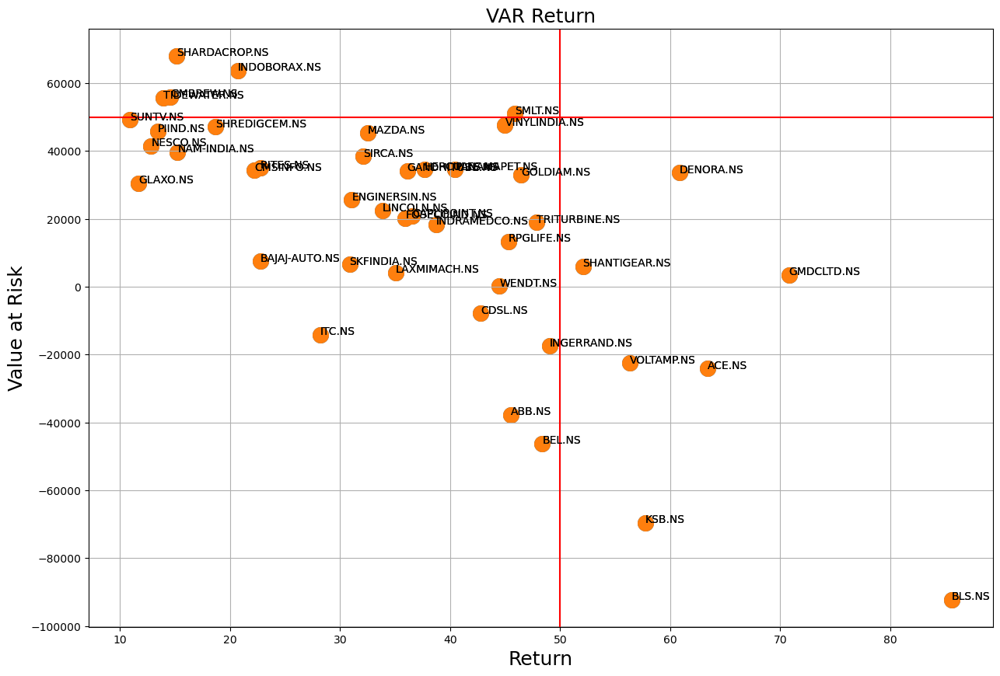

In [25]:
plt.figure(figsize=[15,10])
x= df2['Return%']
y = df2['Value at Risk']
annotations = df2["Ticker"]
plt.grid(True)
plt.title('VAR Return', fontsize=18, color='black')
plt.xlabel("Return",fontsize=18, color='black')
plt.ylabel("Value at Risk", fontsize=18, color='black') 
plt.scatter(x, y,s=200 )
for i, label in enumerate(annotations):
    plt.annotate(label, (x[i], y[i]))
plt.scatter(x, y,s=200 )
for i, label in enumerate(annotations):
    plt.annotate(label, (x[i], y[i]))
plt.axvline(x = 50, color = 'r', label = 'axvline - full height')
plt.axhline(y=50000, color='r', linestyle='-')
plt.show()

plt.show()

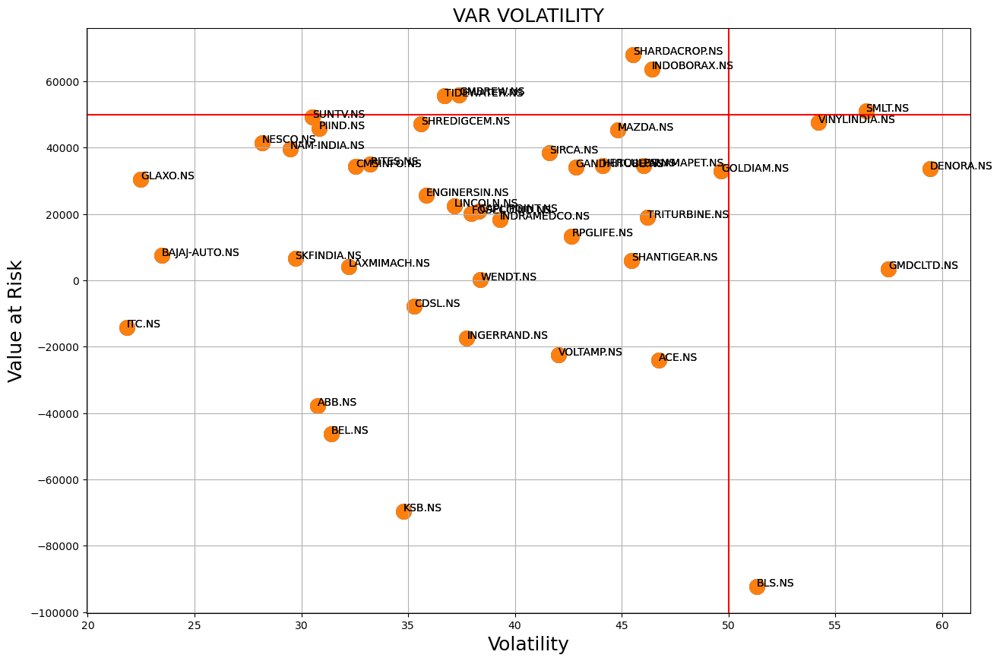

In [26]:
plt.figure(figsize=[15,10])
x= df2['Volatility%']
y = df2['Value at Risk']
annotations = df2["Ticker"]
plt.grid(True)
plt.title('VAR VOLATILITY', fontsize=18, color='black')
plt.xlabel("Volatility",fontsize=18, color='black')
plt.ylabel("Value at Risk", fontsize=18, color='black') 
plt.scatter(x, y,s=200 )
for i, label in enumerate(annotations):
    plt.annotate(label, (x[i], y[i]))
plt.scatter(x, y,s=200 )
for i, label in enumerate(annotations):
    plt.annotate(label, (x[i], y[i]))
plt.axvline(x = 50, color = 'r', label = 'axvline - full height')
plt.axhline(y=50000, color='r', linestyle='-')
plt.show()

plt.show()

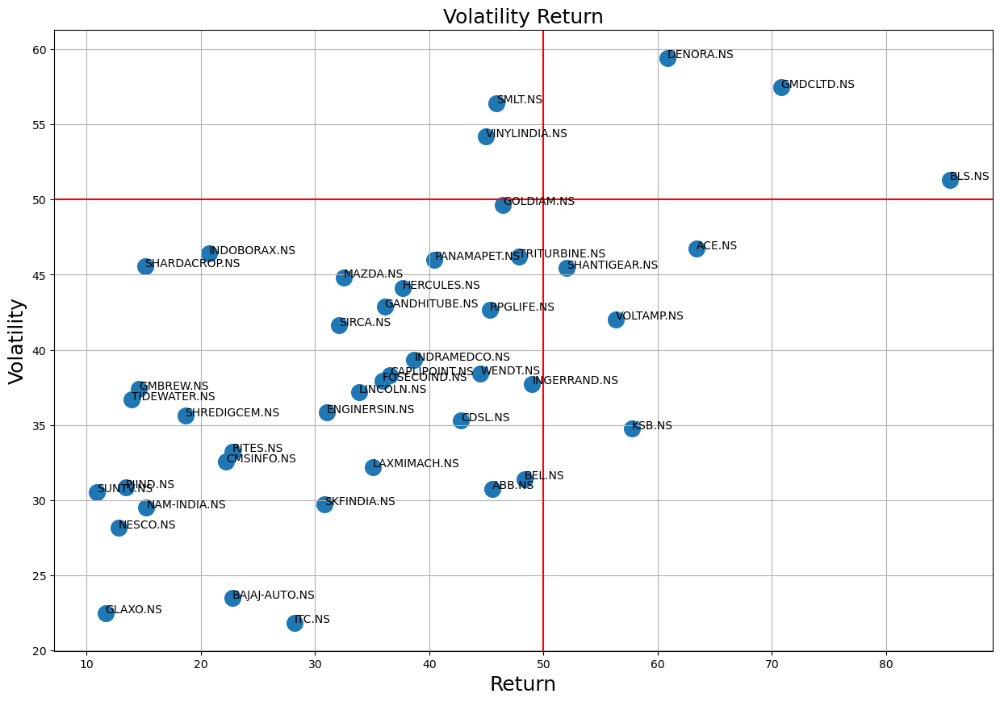

In [27]:
plt.figure(figsize=[15,10])
x= df2['Return%']
y = df2['Volatility%']
annotations = np.array(df2["Ticker"])
plt.grid(True)
plt.title('Volatility Return', fontsize=18, color='black')
plt.xlabel("Return",fontsize=18, color='black')
plt.ylabel("Volatility", fontsize=18, color='black') 
plt.scatter(x, y,s=200 )
i=0
for labels in annotations:
    plt.annotate(labels, (x[i], y[i]))
    i=i+1
plt.axvline(x = 50, color = 'r', label = 'axvline - full height')
plt.axhline(y=50, color='r', linestyle='-')
plt.show()

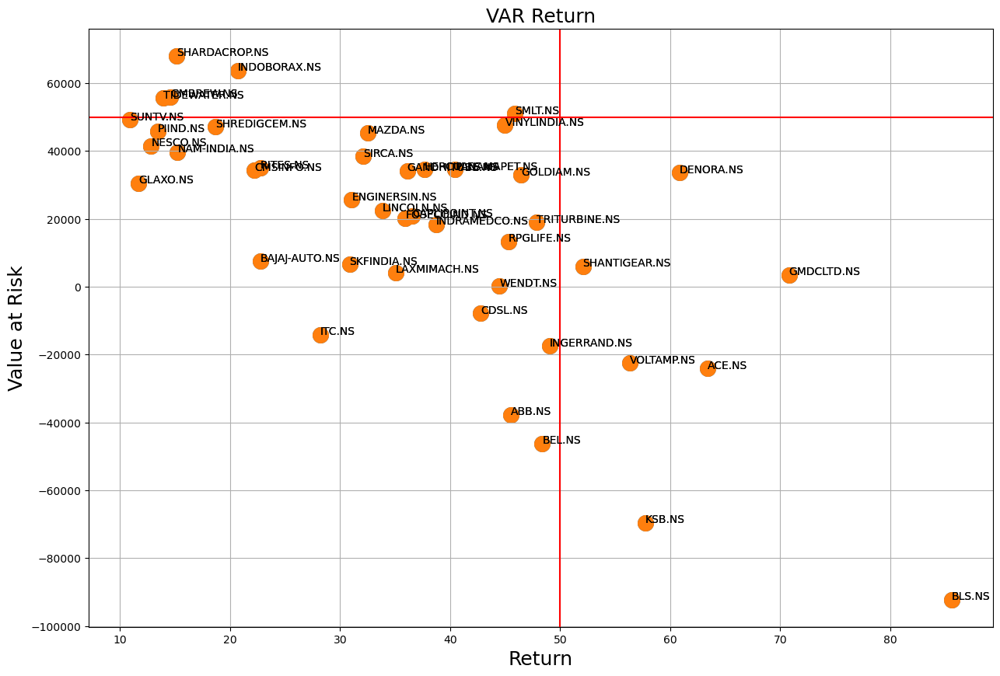

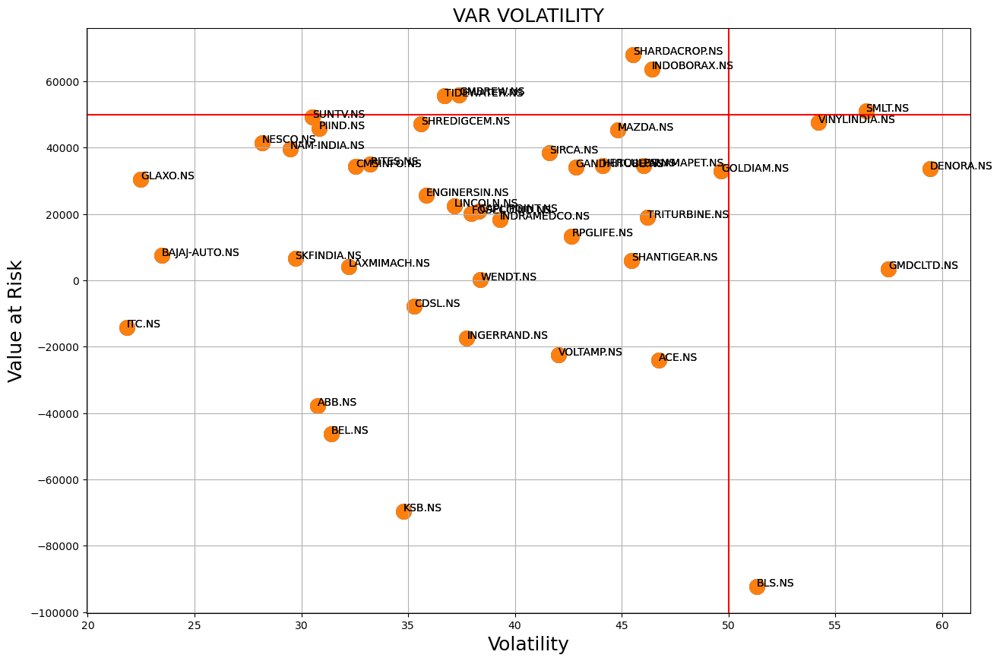

In [28]:
plt.figure(figsize=[15,10])
x= df2['Return%']
y = df2['Value at Risk']
annotations = df2["Ticker"]
plt.grid(True)
plt.title('VAR Return', fontsize=18, color='black')
plt.xlabel("Return",fontsize=18, color='black')
plt.ylabel("Value at Risk", fontsize=18, color='black') 
plt.scatter(x, y,s=200 )
for i, label in enumerate(annotations):
    plt.annotate(label, (x[i], y[i]))
plt.scatter(x, y,s=200 )
for i, label in enumerate(annotations):
    plt.annotate(label, (x[i], y[i]))
plt.axvline(x = 50, color = 'r', label = 'axvline - full height')
plt.axhline(y=50000, color='r', linestyle='-')
plt.show()

plt.figure(figsize=[15,10])
x= df2['Volatility%']
y = df2['Value at Risk']
annotations = df2["Ticker"]
plt.grid(True)
plt.title('VAR VOLATILITY', fontsize=18, color='black')
plt.xlabel("Volatility",fontsize=18, color='black')
plt.ylabel("Value at Risk", fontsize=18, color='black') 
plt.scatter(x, y,s=200 )
for i, label in enumerate(annotations):
    plt.annotate(label, (x[i], y[i]))
plt.scatter(x, y,s=200 )
for i, label in enumerate(annotations):
    plt.annotate(label, (x[i], y[i]))
plt.axvline(x = 50, color = 'r', label = 'axvline - full height')
plt.axhline(y=50000, color='r', linestyle='-')
plt.show()

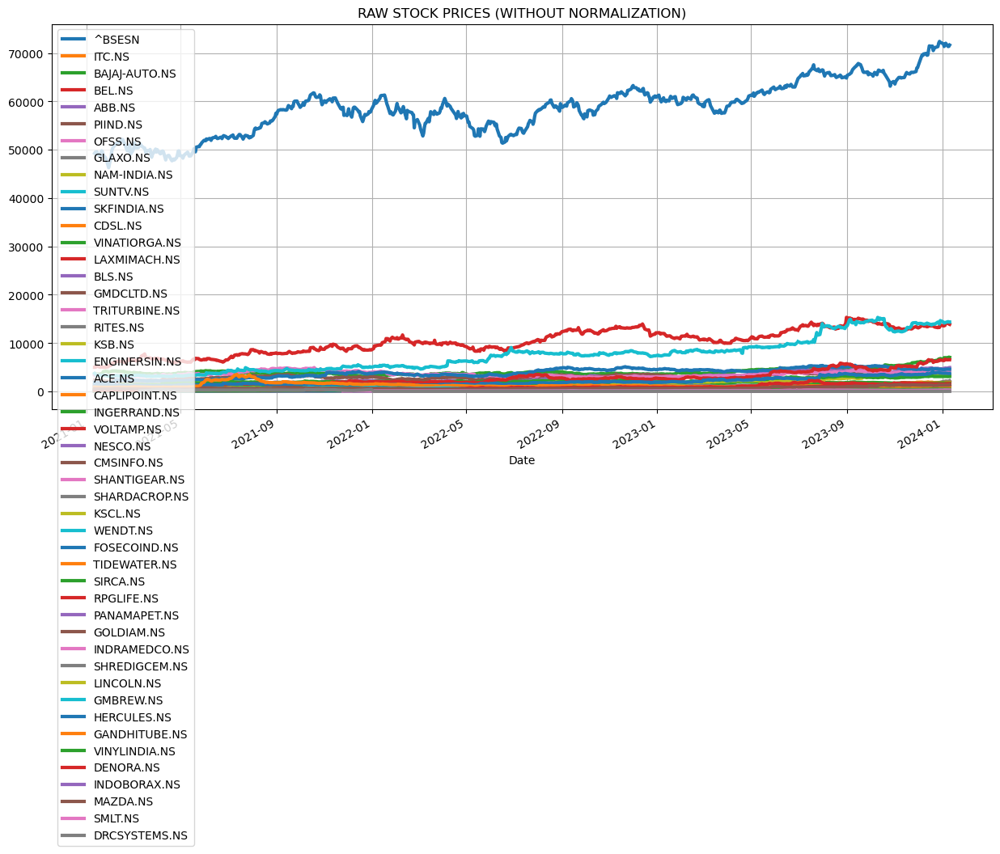

In [29]:
stocks_df = data
def show_plot(df, fig_title):
  df.plot(x = 'Date', figsize = (15,7), linewidth = 3, title = fig_title)
  plt.grid()
  plt.show()
stocks_df = stocks_df.reset_index()
show_plot(stocks_df, 'RAW STOCK PRICES (WITHOUT NORMALIZATION)')

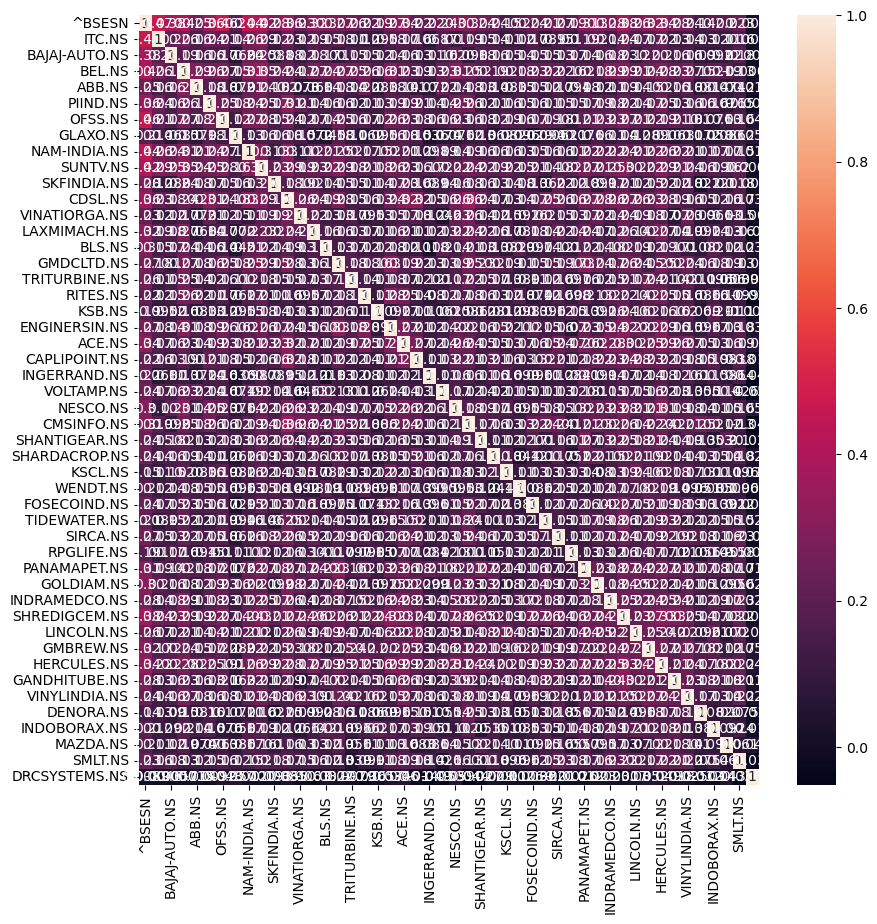

In [30]:
def daily_return(df):
  df_daily_return = df.copy()

  # Loop through each stock (while ignoring time columns with index 0)
  for i in df.columns[1:]:
    
    # Loop through each row belonging to the stock
    for j in range(1, len(df)):

      # Calculate the percentage of change from the previous day
      df_daily_return[i][j] = ((df[i][j]- df[i][j-1])/df[i][j-1]) * 100
    
    # set the value of first row to zero since the previous value is not available
    df_daily_return[i][0] = 0
  
  return df_daily_return

# Get the daily returns 
stocks_daily_return = daily_return(stocks_df)

# Daily Return Correlation
cm = stocks_daily_return.drop(columns = ['Date']).corr()

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from copy import copy
from scipy import stats
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
plt.figure(figsize=(10, 10))
ax = plt.subplot()
sns.heatmap(cm, annot = True, ax = ax);

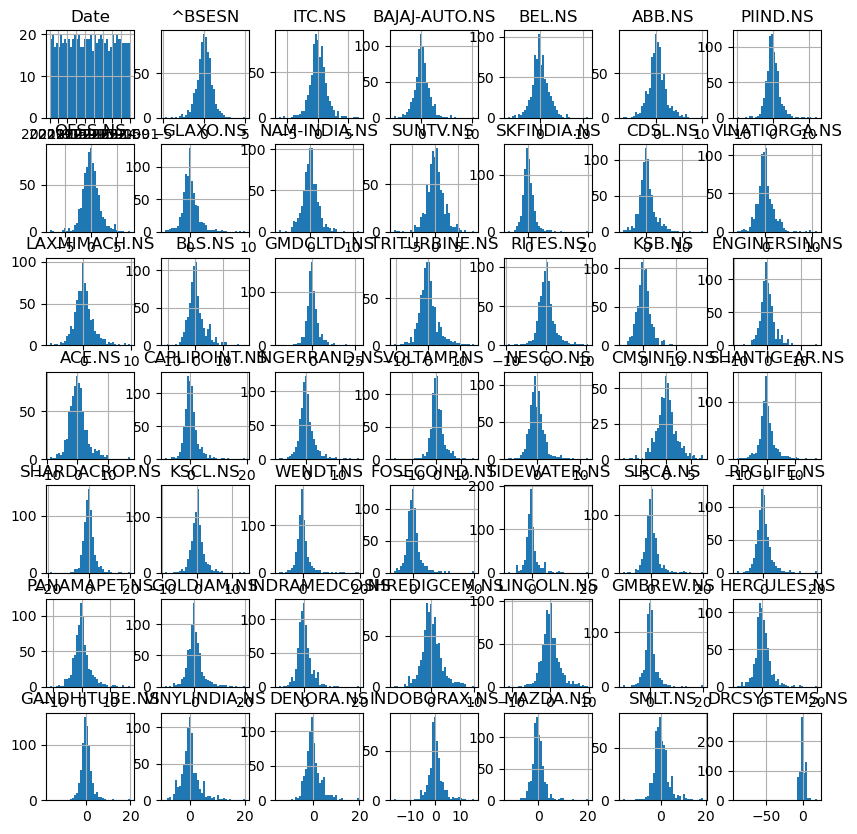

In [31]:
# Histogram of daily returns
# Stock returns are normally distributed with zero mean 
# Notice how Tesla Standard deviation is high indicating a more volatile stock
stocks_daily_return.hist(figsize=(10, 10), bins = 40);

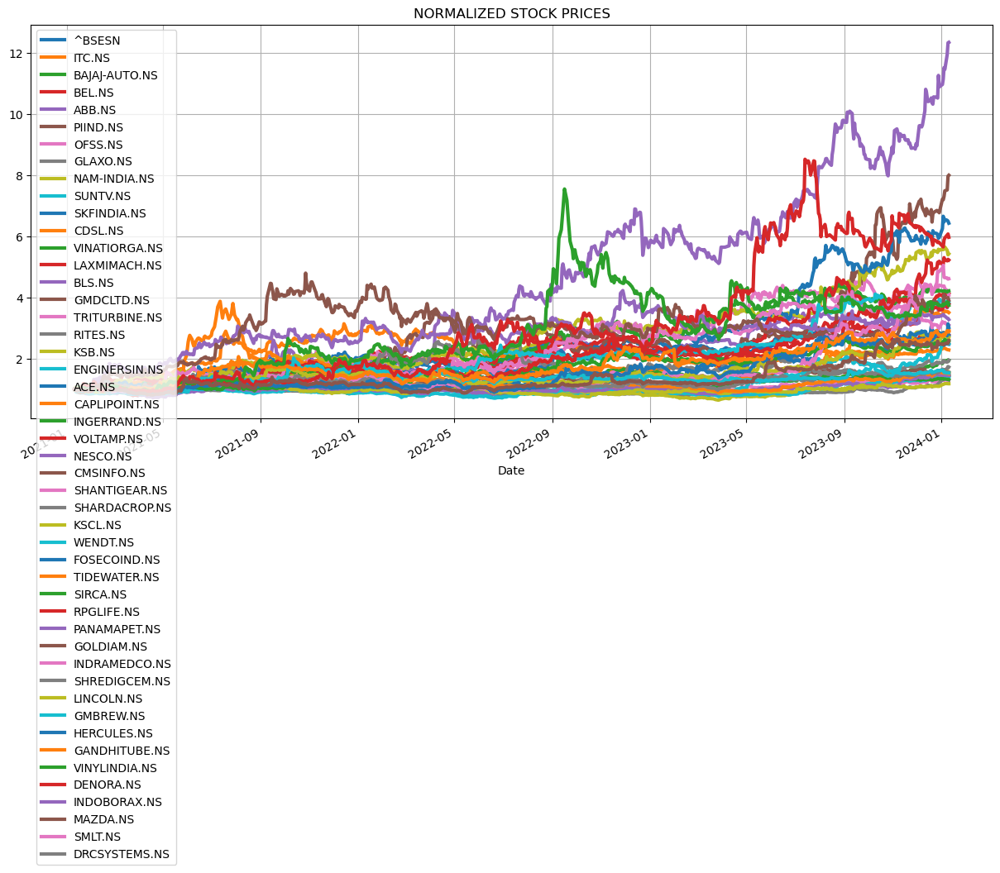

In [32]:
# Function to normalize the prices based on the initial price
# The function simply divides every stock by it's price at the start date (i.e.: Date = 2012-01-12)	
def normalize(df):
  x = df.copy()

  # Loop through each stock (while ignoring time columns with index 0)
  for i in x.columns[1:]:
    x[i] = x[i]/x[i][0]
  return x

# Plot normalized data
# Notice the massive gains in Tesla Stock compared to Amazon (second place)
show_plot(normalize(stocks_df), 'NORMALIZED STOCK PRICES')

In [33]:
patterns = {
    'CDL2CROWS':'Two Crows',
    'CDL3BLACKCROWS':'Three Black Crows',
    'CDL3INSIDE':'Three Inside Up/Down',
    'CDL3LINESTRIKE':'Three-Line Strike',
    'CDL3OUTSIDE':'Three Outside Up/Down',
    'CDL3STARSINSOUTH':'Three Stars In The South',
    'CDL3WHITESOLDIERS':'Three Advancing White Soldiers',
    'CDLABANDONEDBABY':'Abandoned Baby',
    'CDLADVANCEBLOCK':'Advance Block',
    'CDLBELTHOLD':'Belt-hold',
    'CDLBREAKAWAY':'Breakaway',
    'CDLCLOSINGMARUBOZU':'Closing Marubozu',
    'CDLCONCEALBABYSWALL':'Concealing Baby Swallow',
    'CDLCOUNTERATTACK':'Counterattack',
    'CDLDARKCLOUDCOVER':'Dark Cloud Cover',
    'CDLDOJI':'Doji',
    'CDLDOJISTAR':'Doji Star',
    'CDLDRAGONFLYDOJI':'Dragonfly Doji',
    'CDLENGULFING':'Engulfing Pattern',
    'CDLEVENINGDOJISTAR':'Evening Doji Star',
    'CDLEVENINGSTAR':'Evening Star',
    'CDLGAPSIDESIDEWHITE':'Up/Down-gap side-by-side white lines',
    'CDLGRAVESTONEDOJI':'Gravestone Doji',
    'CDLHAMMER':'Hammer',
    'CDLHANGINGMAN':'Hanging Man',
    'CDLHARAMI':'Harami Pattern',
    'CDLHARAMICROSS':'Harami Cross Pattern',
    'CDLHIGHWAVE':'High-Wave Candle',
    'CDLHIKKAKE':'Hikkake Pattern',
    'CDLHIKKAKEMOD':'Modified Hikkake Pattern',
    'CDLHOMINGPIGEON':'Homing Pigeon',
    'CDLIDENTICAL3CROWS':'Identical Three Crows',
    'CDLINNECK':'In-Neck Pattern',
    'CDLINVERTEDHAMMER':'Inverted Hammer',
    'CDLKICKING':'Kicking',
    'CDLKICKINGBYLENGTH':'Kicking - bull/bear determined by the longer marubozu',
    'CDLLADDERBOTTOM':'Ladder Bottom',
    'CDLLONGLEGGEDDOJI':'Long Legged Doji',
    'CDLLONGLINE':'Long Line Candle',
    'CDLMARUBOZU':'Marubozu',
    'CDLMATCHINGLOW':'Matching Low',
    'CDLMATHOLD':'Mat Hold',
    'CDLMORNINGDOJISTAR':'Morning Doji Star',
    'CDLMORNINGSTAR':'Morning Star',
    'CDLONNECK':'On-Neck Pattern',
    'CDLPIERCING':'Piercing Pattern',
    'CDLRICKSHAWMAN':'Rickshaw Man',
    'CDLRISEFALL3METHODS':'Rising/Falling Three Methods',
    'CDLSEPARATINGLINES':'Separating Lines',
    'CDLSHOOTINGSTAR':'Shooting Star',
    'CDLSHORTLINE':'Short Line Candle',
    'CDLSPINNINGTOP':'Spinning Top',
    'CDLSTALLEDPATTERN':'Stalled Pattern',
    'CDLSTICKSANDWICH':'Stick Sandwich',
    'CDLTAKURI':'Takuri (Dragonfly Doji with very long lower shadow)',
    'CDLTASUKIGAP':'Tasuki Gap',
    'CDLTHRUSTING':'Thrusting Pattern',
    'CDLTRISTAR':'Tristar Pattern',
    'CDLUNIQUE3RIVER':'Unique 3 River',
    'CDLUPSIDEGAP2CROWS':'Upside Gap Two Crows',
    'CDLXSIDEGAP3METHODS':'Upside/Downside Gap Three Methods'
}

In [34]:
import os, csv
import pandas as pd
import yfinance as yf
import talib

import datetime
import pandas as pd
import yfinance as yf
import plotly.graph_objects as go

def candle_trend(patterns,tickers):
    
    data = pd.DataFrame(columns=['Ticker','Candle-Pattern','Definition','Signal'])
    for t in tickers:
        try: 
            df = yf.download(t, period="4y") 
    
        
            for pattern in patterns:
                ta_function = getattr(talib, pattern)
                result = ta_function(df['Open'], df['High'], df['Low'], df['Close'])
                last_pattern = result.tail(1).values[0]
                if last_pattern > 0:
                    data = data.append(pd.Series([t,pattern,patterns[pattern],"BULLISH"],index=data.columns), ignore_index=True)
                
                
                elif last_pattern < 0:
                    data = data.append(pd.Series([t,pattern,patterns[pattern],"BEAR"],index=data.columns), ignore_index=True)
        except:
            continue

    return data
g=candle_trend(patterns,tickers)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [35]:
g

,Ticker,Candle-Pattern,Definition,Signal


In [36]:
g.Ticker.unique()

array([], dtype=object)

In [37]:
g['Candle-Pattern'].unique()

array([], dtype=object)

In [38]:
df2.head(20)

,index,Ticker,Cov_mar,Market_var,Beta,Volatility%,Return%,CV,Sharp Ratio,CAGR,MAXDD%,Value at Risk
0,13,BLS.NS,0.022786,0.021845,1.043108,51.327260,85.574569,59.979572,1.569820,135.041249,38.641955,-92215.433664
1,14,GMDCLTD.NS,0.023630,0.021845,1.081753,57.487155,70.799247,81.197409,1.144590,102.797350,42.975015,3536.950673
2,19,ACE.NS,0.023697,0.021845,1.084808,46.723038,63.372146,73.728036,1.249323,88.299997,36.268873,-24042.669683
3,42,DENORA.NS,0.012762,0.021845,0.584235,59.435015,60.849110,97.676062,0.939667,83.614805,35.664564,33568.006399
4,17,KSB.NS,0.010256,0.021845,0.469505,34.767848,57.716176,60.239348,1.516234,77.767462,29.013796,-69531.208847
5,22,VOLTAMP.NS,0.015086,0.021845,0.690609,42.040980,56.315102,74.653119,1.220597,75.486342,31.442913,-22483.179439
6,25,SHANTIGEAR.NS,0.016909,0.021845,0.774071,45.453673,52.059847,87.310425,1.035336,68.185257,28.747176,6007.276225
7,21,INGERRAND.NS,0.012651,0.021845,0.579124,37.742239,49.016838,76.998519,1.166249,63.151150,24.483418,-17426.774641
8,2,BEL.NS,0.018603,0.021845,0.851625,31.397501,48.353309,64.933510,1.380789,62.073630,22.007849,-46152.778518
9,15,TRITURBINE.NS,0.018330,0.021845,0.839127,46.210651,47.861279,96.551224,0.927519,61.279209,31.684732,18984.370508


In [39]:
df2[(df2['CAGR']>15 ) & (df2['Return%']>15)]

,index,Ticker,Cov_mar,Market_var,Beta,Volatility%,Return%,CV,Sharp Ratio,CAGR,MAXDD%,Value at Risk
0,13,BLS.NS,0.022786,0.021845,1.043108,51.327260,85.574569,59.979572,1.569820,135.041249,38.641955,-92215.433664
1,14,GMDCLTD.NS,0.023630,0.021845,1.081753,57.487155,70.799247,81.197409,1.144590,102.797350,42.975015,3536.950673
2,19,ACE.NS,0.023697,0.021845,1.084808,46.723038,63.372146,73.728036,1.249323,88.299997,36.268873,-24042.669683
3,42,DENORA.NS,0.012762,0.021845,0.584235,59.435015,60.849110,97.676062,0.939667,83.614805,35.664564,33568.006399
4,17,KSB.NS,0.010256,0.021845,0.469505,34.767848,57.716176,60.239348,1.516234,77.767462,29.013796,-69531.208847
5,22,VOLTAMP.NS,0.015086,0.021845,0.690609,42.040980,56.315102,74.653119,1.220597,75.486342,31.442913,-22483.179439
6,25,SHANTIGEAR.NS,0.016909,0.021845,0.774071,45.453673,52.059847,87.310425,1.035336,68.185257,28.747176,6007.276225
7,21,INGERRAND.NS,0.012651,0.021845,0.579124,37.742239,49.016838,76.998519,1.166249,63.151150,24.483418,-17426.774641
8,2,BEL.NS,0.018603,0.021845,0.851625,31.397501,48.353309,64.933510,1.380789,62.073630,22.007849,-46152.778518
9,15,TRITURBINE.NS,0.018330,0.021845,0.839127,46.210651,47.861279,96.551224,0.927519,61.279209,31.684732,18984.370508


In [40]:
df2[(df2['CAGR']>15 ) & (df2['Return%']>15) & (df2['Volatility%']<50)]

,index,Ticker,Cov_mar,Market_var,Beta,Volatility%,Return%,CV,Sharp Ratio,CAGR,MAXDD%,Value at Risk
2,19,ACE.NS,0.023697,0.021845,1.084808,46.723038,63.372146,73.728036,1.249323,88.299997,36.268873,-24042.669683
4,17,KSB.NS,0.010256,0.021845,0.469505,34.767848,57.716176,60.239348,1.516234,77.767462,29.013796,-69531.208847
5,22,VOLTAMP.NS,0.015086,0.021845,0.690609,42.040980,56.315102,74.653119,1.220597,75.486342,31.442913,-22483.179439
6,25,SHANTIGEAR.NS,0.016909,0.021845,0.774071,45.453673,52.059847,87.310425,1.035336,68.185257,28.747176,6007.276225
7,21,INGERRAND.NS,0.012651,0.021845,0.579124,37.742239,49.016838,76.998519,1.166249,63.151150,24.483418,-17426.774641
8,2,BEL.NS,0.018603,0.021845,0.851625,31.397501,48.353309,64.933510,1.380789,62.073630,22.007849,-46152.778518
9,15,TRITURBINE.NS,0.018330,0.021845,0.839127,46.210651,47.861279,96.551224,0.927519,61.279209,31.684732,18984.370508
10,34,GOLDIAM.NS,0.022829,0.021845,1.045048,49.669689,46.448055,106.935993,0.834474,59.019033,45.219532,32921.267089
12,3,ABB.NS,0.011703,0.021845,0.535751,30.755939,45.513847,67.574906,1.317269,57.542369,21.263625,-37718.099235
13,32,RPGLIFE.NS,0.012233,0.021845,0.560017,42.655035,45.301992,94.157085,0.944836,57.209411,35.861252,13349.417409


In [41]:
np.corrcoef(df1['CV'], df1['Value at Risk'])[0][1]

0.7330600025273142

In [42]:
def t_stat_corr(df, x, y):
    """Returns the t-statistic for the correlation between 2 variables"""
    corr_xy = np.corrcoef(df[x], df[y])[0][1]
    n = len(df)
    
    t_stat = (corr_xy * np.sqrt(n - 2)) / np.sqrt(1 - corr_xy ** 2)
    
    return t_stat

In [43]:
# H1
t_stat_corr(df=df1, y='Value at Risk', x='CV')

6.901092153043072

In [44]:
t_stat_corr(df=df1, y='Return%', x='CV')

-8.33348173558743

In [45]:
t_stat_corr(df=df1, y='Volatility%', x='Return%')

5.01138068851488

In [46]:
t_stat_corr(df=df1, y='Volatility%', x='CV')

-1.2107751657533825

In [47]:
t_stat_corr(df=df1, y='Volatility%', x='MAXDD%')

2.429117176341399

In [48]:

t_stat_corr(df=df1, y='Return%', x='MAXDD%')

-0.9718189039601488

In [49]:
df2[(df2['CAGR']>20 ) & (df2['Return%']>20) & (df2['Volatility%']<50)]

,index,Ticker,Cov_mar,Market_var,Beta,Volatility%,Return%,CV,Sharp Ratio,CAGR,MAXDD%,Value at Risk
2,19,ACE.NS,0.023697,0.021845,1.084808,46.723038,63.372146,73.728036,1.249323,88.299997,36.268873,-24042.669683
4,17,KSB.NS,0.010256,0.021845,0.469505,34.767848,57.716176,60.239348,1.516234,77.767462,29.013796,-69531.208847
5,22,VOLTAMP.NS,0.015086,0.021845,0.690609,42.040980,56.315102,74.653119,1.220597,75.486342,31.442913,-22483.179439
6,25,SHANTIGEAR.NS,0.016909,0.021845,0.774071,45.453673,52.059847,87.310425,1.035336,68.185257,28.747176,6007.276225
7,21,INGERRAND.NS,0.012651,0.021845,0.579124,37.742239,49.016838,76.998519,1.166249,63.151150,24.483418,-17426.774641
8,2,BEL.NS,0.018603,0.021845,0.851625,31.397501,48.353309,64.933510,1.380789,62.073630,22.007849,-46152.778518
9,15,TRITURBINE.NS,0.018330,0.021845,0.839127,46.210651,47.861279,96.551224,0.927519,61.279209,31.684732,18984.370508
10,34,GOLDIAM.NS,0.022829,0.021845,1.045048,49.669689,46.448055,106.935993,0.834474,59.019033,45.219532,32921.267089
12,3,ABB.NS,0.011703,0.021845,0.535751,30.755939,45.513847,67.574906,1.317269,57.542369,21.263625,-37718.099235
13,32,RPGLIFE.NS,0.012233,0.021845,0.560017,42.655035,45.301992,94.157085,0.944836,57.209411,35.861252,13349.417409


In [50]:
df3 = df2[(df2['CAGR']>20 ) & (df2['Return%']>20) & (df2['Volatility%']<50) & (df2['Value at Risk']<52000)]
df3

,index,Ticker,Cov_mar,Market_var,Beta,Volatility%,Return%,CV,Sharp Ratio,CAGR,MAXDD%,Value at Risk
2,19,ACE.NS,0.023697,0.021845,1.084808,46.723038,63.372146,73.728036,1.249323,88.299997,36.268873,-24042.669683
4,17,KSB.NS,0.010256,0.021845,0.469505,34.767848,57.716176,60.239348,1.516234,77.767462,29.013796,-69531.208847
5,22,VOLTAMP.NS,0.015086,0.021845,0.690609,42.040980,56.315102,74.653119,1.220597,75.486342,31.442913,-22483.179439
6,25,SHANTIGEAR.NS,0.016909,0.021845,0.774071,45.453673,52.059847,87.310425,1.035336,68.185257,28.747176,6007.276225
7,21,INGERRAND.NS,0.012651,0.021845,0.579124,37.742239,49.016838,76.998519,1.166249,63.151150,24.483418,-17426.774641
8,2,BEL.NS,0.018603,0.021845,0.851625,31.397501,48.353309,64.933510,1.380789,62.073630,22.007849,-46152.778518
9,15,TRITURBINE.NS,0.018330,0.021845,0.839127,46.210651,47.861279,96.551224,0.927519,61.279209,31.684732,18984.370508
10,34,GOLDIAM.NS,0.022829,0.021845,1.045048,49.669689,46.448055,106.935993,0.834474,59.019033,45.219532,32921.267089
12,3,ABB.NS,0.011703,0.021845,0.535751,30.755939,45.513847,67.574906,1.317269,57.542369,21.263625,-37718.099235
13,32,RPGLIFE.NS,0.012233,0.021845,0.560017,42.655035,45.301992,94.157085,0.944836,57.209411,35.861252,13349.417409


In [51]:
df3.reset_index(inplace = True)

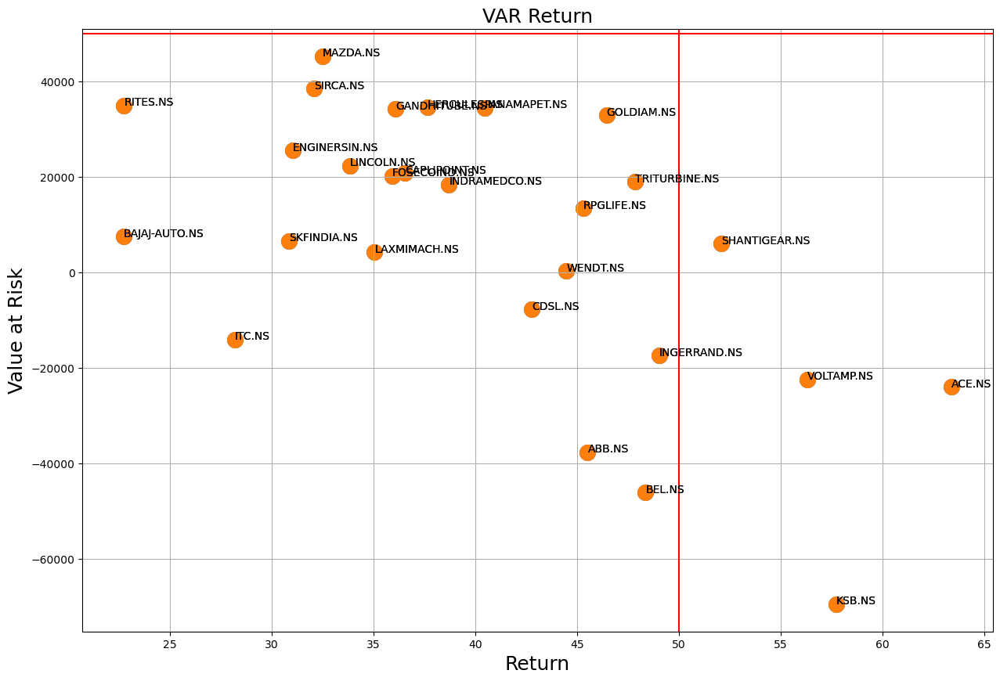

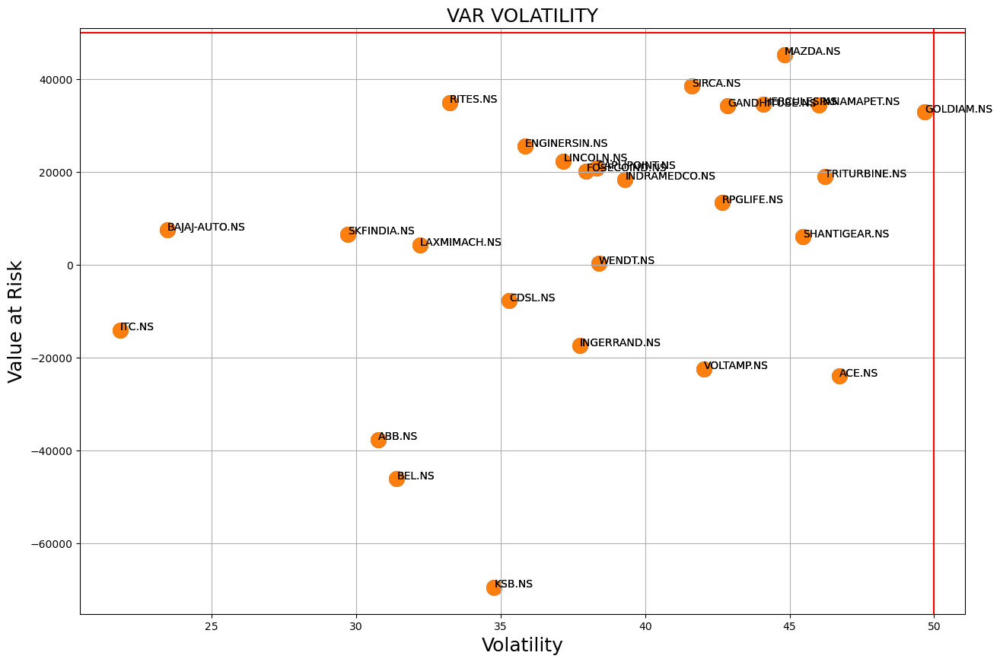

In [52]:
plt.figure(figsize=[15,10])
x= df3['Return%']
y = df3['Value at Risk']
annotations = df3["Ticker"]
plt.grid(True)
plt.title('VAR Return', fontsize=18, color='black')
plt.xlabel("Return",fontsize=18, color='black')
plt.ylabel("Value at Risk", fontsize=18, color='black') 
plt.scatter(x, y,s=200 )
for i, label in enumerate(annotations):
    plt.annotate(label, (x[i], y[i]))
plt.scatter(x, y,s=200 )
for i, label in enumerate(annotations):
    plt.annotate(label, (x[i], y[i]))
plt.axvline(x = 50, color = 'r', label = 'axvline - full height')
plt.axhline(y=50000, color='r', linestyle='-')
plt.show()

plt.figure(figsize=[15,10])
x= df3['Volatility%']
y = df3['Value at Risk']
annotations = df3["Ticker"]
plt.grid(True)
plt.title('VAR VOLATILITY', fontsize=18, color='black')
plt.xlabel("Volatility",fontsize=18, color='black')
plt.ylabel("Value at Risk", fontsize=18, color='black') 
plt.scatter(x, y,s=200 )
for i, label in enumerate(annotations):
    plt.annotate(label, (x[i], y[i]))
plt.scatter(x, y,s=200 )
for i, label in enumerate(annotations):
    plt.annotate(label, (x[i], y[i]))
plt.axvline(x = 50, color = 'r', label = 'axvline - full height')
plt.axhline(y=50000, color='r', linestyle='-')
plt.show()

In [53]:
len(df3)

27

In [54]:
df4 = df3.sort_values(by='Return%', ascending=False)

In [55]:
df4.head(40)

,level_0,index,Ticker,Cov_mar,Market_var,Beta,Volatility%,Return%,CV,Sharp Ratio,CAGR,MAXDD%,Value at Risk
0,2,19,ACE.NS,0.023697,0.021845,1.084808,46.723038,63.372146,73.728036,1.249323,88.299997,36.268873,-24042.669683
1,4,17,KSB.NS,0.010256,0.021845,0.469505,34.767848,57.716176,60.239348,1.516234,77.767462,29.013796,-69531.208847
2,5,22,VOLTAMP.NS,0.015086,0.021845,0.690609,42.040980,56.315102,74.653119,1.220597,75.486342,31.442913,-22483.179439
3,6,25,SHANTIGEAR.NS,0.016909,0.021845,0.774071,45.453673,52.059847,87.310425,1.035336,68.185257,28.747176,6007.276225
4,7,21,INGERRAND.NS,0.012651,0.021845,0.579124,37.742239,49.016838,76.998519,1.166249,63.151150,24.483418,-17426.774641
5,8,2,BEL.NS,0.018603,0.021845,0.851625,31.397501,48.353309,64.933510,1.380789,62.073630,22.007849,-46152.778518
6,9,15,TRITURBINE.NS,0.018330,0.021845,0.839127,46.210651,47.861279,96.551224,0.927519,61.279209,31.684732,18984.370508
7,10,34,GOLDIAM.NS,0.022829,0.021845,1.045048,49.669689,46.448055,106.935993,0.834474,59.019033,45.219532,32921.267089
8,12,3,ABB.NS,0.011703,0.021845,0.535751,30.755939,45.513847,67.574906,1.317269,57.542369,21.263625,-37718.099235
9,13,32,RPGLIFE.NS,0.012233,0.021845,0.560017,42.655035,45.301992,94.157085,0.944836,57.209411,35.861252,13349.417409


In [56]:
df4.tail(30)

,level_0,index,Ticker,Cov_mar,Market_var,Beta,Volatility%,Return%,CV,Sharp Ratio,CAGR,MAXDD%,Value at Risk
0,2,19,ACE.NS,0.023697,0.021845,1.084808,46.723038,63.372146,73.728036,1.249323,88.299997,36.268873,-24042.669683
1,4,17,KSB.NS,0.010256,0.021845,0.469505,34.767848,57.716176,60.239348,1.516234,77.767462,29.013796,-69531.208847
2,5,22,VOLTAMP.NS,0.015086,0.021845,0.690609,42.040980,56.315102,74.653119,1.220597,75.486342,31.442913,-22483.179439
3,6,25,SHANTIGEAR.NS,0.016909,0.021845,0.774071,45.453673,52.059847,87.310425,1.035336,68.185257,28.747176,6007.276225
4,7,21,INGERRAND.NS,0.012651,0.021845,0.579124,37.742239,49.016838,76.998519,1.166249,63.151150,24.483418,-17426.774641
5,8,2,BEL.NS,0.018603,0.021845,0.851625,31.397501,48.353309,64.933510,1.380789,62.073630,22.007849,-46152.778518
6,9,15,TRITURBINE.NS,0.018330,0.021845,0.839127,46.210651,47.861279,96.551224,0.927519,61.279209,31.684732,18984.370508
7,10,34,GOLDIAM.NS,0.022829,0.021845,1.045048,49.669689,46.448055,106.935993,0.834474,59.019033,45.219532,32921.267089
8,12,3,ABB.NS,0.011703,0.021845,0.535751,30.755939,45.513847,67.574906,1.317269,57.542369,21.263625,-37718.099235
9,13,32,RPGLIFE.NS,0.012233,0.021845,0.560017,42.655035,45.301992,94.157085,0.944836,57.209411,35.861252,13349.417409


In [57]:
df3.head(20)

,level_0,index,Ticker,Cov_mar,Market_var,Beta,Volatility%,Return%,CV,Sharp Ratio,CAGR,MAXDD%,Value at Risk
0,2,19,ACE.NS,0.023697,0.021845,1.084808,46.723038,63.372146,73.728036,1.249323,88.299997,36.268873,-24042.669683
1,4,17,KSB.NS,0.010256,0.021845,0.469505,34.767848,57.716176,60.239348,1.516234,77.767462,29.013796,-69531.208847
2,5,22,VOLTAMP.NS,0.015086,0.021845,0.690609,42.040980,56.315102,74.653119,1.220597,75.486342,31.442913,-22483.179439
3,6,25,SHANTIGEAR.NS,0.016909,0.021845,0.774071,45.453673,52.059847,87.310425,1.035336,68.185257,28.747176,6007.276225
4,7,21,INGERRAND.NS,0.012651,0.021845,0.579124,37.742239,49.016838,76.998519,1.166249,63.151150,24.483418,-17426.774641
5,8,2,BEL.NS,0.018603,0.021845,0.851625,31.397501,48.353309,64.933510,1.380789,62.073630,22.007849,-46152.778518
6,9,15,TRITURBINE.NS,0.018330,0.021845,0.839127,46.210651,47.861279,96.551224,0.927519,61.279209,31.684732,18984.370508
7,10,34,GOLDIAM.NS,0.022829,0.021845,1.045048,49.669689,46.448055,106.935993,0.834474,59.019033,45.219532,32921.267089
8,12,3,ABB.NS,0.011703,0.021845,0.535751,30.755939,45.513847,67.574906,1.317269,57.542369,21.263625,-37718.099235
9,13,32,RPGLIFE.NS,0.012233,0.021845,0.560017,42.655035,45.301992,94.157085,0.944836,57.209411,35.861252,13349.417409


In [58]:
df2.head(30)

,index,Ticker,Cov_mar,Market_var,Beta,Volatility%,Return%,CV,Sharp Ratio,CAGR,MAXDD%,Value at Risk
0,13,BLS.NS,0.022786,0.021845,1.043108,51.327260,85.574569,59.979572,1.569820,135.041249,38.641955,-92215.433664
1,14,GMDCLTD.NS,0.023630,0.021845,1.081753,57.487155,70.799247,81.197409,1.144590,102.797350,42.975015,3536.950673
2,19,ACE.NS,0.023697,0.021845,1.084808,46.723038,63.372146,73.728036,1.249323,88.299997,36.268873,-24042.669683
3,42,DENORA.NS,0.012762,0.021845,0.584235,59.435015,60.849110,97.676062,0.939667,83.614805,35.664564,33568.006399
4,17,KSB.NS,0.010256,0.021845,0.469505,34.767848,57.716176,60.239348,1.516234,77.767462,29.013796,-69531.208847
5,22,VOLTAMP.NS,0.015086,0.021845,0.690609,42.040980,56.315102,74.653119,1.220597,75.486342,31.442913,-22483.179439
6,25,SHANTIGEAR.NS,0.016909,0.021845,0.774071,45.453673,52.059847,87.310425,1.035336,68.185257,28.747176,6007.276225
7,21,INGERRAND.NS,0.012651,0.021845,0.579124,37.742239,49.016838,76.998519,1.166249,63.151150,24.483418,-17426.774641
8,2,BEL.NS,0.018603,0.021845,0.851625,31.397501,48.353309,64.933510,1.380789,62.073630,22.007849,-46152.778518
9,15,TRITURBINE.NS,0.018330,0.021845,0.839127,46.210651,47.861279,96.551224,0.927519,61.279209,31.684732,18984.370508
